In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objs as go
from plotly.offline import iplot, plot
import plotly.express as px

import glob
import os

plt.rcParams["figure.figsize"] = 16,10

## Read Data

In [2]:
#list path

In [3]:
os.listdir("../data/raw_data_train/")

['rsq_q1', 'rsq_q2', 'rsq_q3']

In [4]:
os.listdir("../data/raw_data_train/rsq_q1/")

['Accelerometer.csv',
 'Gyroscope.csv',
 'Linear Accelerometer.csv',
 'Location.csv']

In [5]:
pd.read_csv(glob.glob("../data/raw_data_train/rsq_q1/*")[3])

,Time (s),Latitude (°),Longitude (°),Height (m),Velocity (m/s),Direction (°),Horizontal Accuracy (m),Vertical Accuracy (°)
0,0.000000,47.696266,17.726061,118.349480,-1.000000,-1.000000,418.967358,418.967358
1,1.774932,47.695267,17.724532,120.897892,10.737622,-1.000000,48.000000,48.000000
2,2.774925,47.695335,17.724412,103.454252,11.802929,-1.000000,32.000000,32.000000
3,3.774918,47.695273,17.724272,114.860346,11.802929,-1.000000,32.000000,32.000000
4,4.774910,47.695239,17.724124,116.224856,12.074264,-1.000000,16.000000,16.000000
...,...,...,...,...,...,...,...,...
626,627.819389,47.705068,17.716240,118.630658,6.965403,185.857483,12.001812,12.001812
627,628.819413,47.705065,17.716240,118.688638,4.823735,185.857483,12.001812,12.001812
628,629.819440,47.705022,17.716237,118.746758,0.121996,182.292480,8.001208,8.001208
629,630.819464,47.705017,17.716237,118.814684,0.118004,182.292480,8.001208,8.001208


In [6]:
path = "../data/raw_data_train/rsq_q1/*"

In [7]:
for path in glob.glob(path):
    print(path)

../data/raw_data_train/rsq_q1\Accelerometer.csv
../data/raw_data_train/rsq_q1\Gyroscope.csv
../data/raw_data_train/rsq_q1\Linear Accelerometer.csv
../data/raw_data_train/rsq_q1\Location.csv


In [8]:
def read_measurement(path):
    
    df = pd.DataFrame()
    
    c = 0
    
    for path in glob.glob(path):
        
        new_df = pd.read_csv(path)
        new_df["sensor"] = path.split('.csv')[0].split("\\")[1]
    
        df = pd.concat([new_df,df], axis=0)    
        c+=1
        
    df = df.pivot_table(index="Time (s)", columns="sensor")

    df = df.reset_index().sort_values("Time (s)")

    new_columns = [
                    "time", "direction", "height", "h_accuracy", "lat", "lon", "velocity", "v_accuracy",
                    "x_acc", "x_lin_acc", "x_gyro",
                    "y_acc", "y_lin_acc", "y_gyro",
                    "z_acc", "z_lin_acc", "z_gyro"
                ]
    df.columns = [i for i in new_columns]

    df =df[["time","lat", "lon", "height", 
            "velocity", "direction",
            "h_accuracy", "v_accuracy", 
            "x_lin_acc", "y_lin_acc", "z_lin_acc", 
            "x_gyro", "y_gyro", "z_gyro",
            "x_acc","y_acc","z_acc", ]]


    
    return df
        

In [9]:
df = read_measurement("../data/raw_data_train/rsq_q1/*")

In [10]:
df.head(20)

,time,lat,lon,height,velocity,direction,h_accuracy,v_accuracy,x_lin_acc,y_lin_acc,z_lin_acc,x_gyro,y_gyro,z_gyro,x_acc,y_acc,z_acc
0,0.000000,47.696266,17.726061,118.34948,-1.0,-1.0,418.967358,418.967358,NaN,NaN,NaN,NaN,NaN,NaN,0.131427,-0.151186,9.977951
1,0.010040,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.003143,-0.063917,9.864187
2,0.020081,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.059127,-0.115410,9.749825
3,0.030121,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.008233,-0.185913,9.694440
4,0.040161,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.092358,-0.152832,9.726773
5,0.050201,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.158969,-0.104333,9.788595
6,0.060242,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.072000,-0.210462,9.713600
7,0.070282,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.061821,-0.048499,9.569450
8,0.080322,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.040566,-0.033381,9.594748
9,0.090363,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.023801,-0.152832,9.672735


## Data Exploration

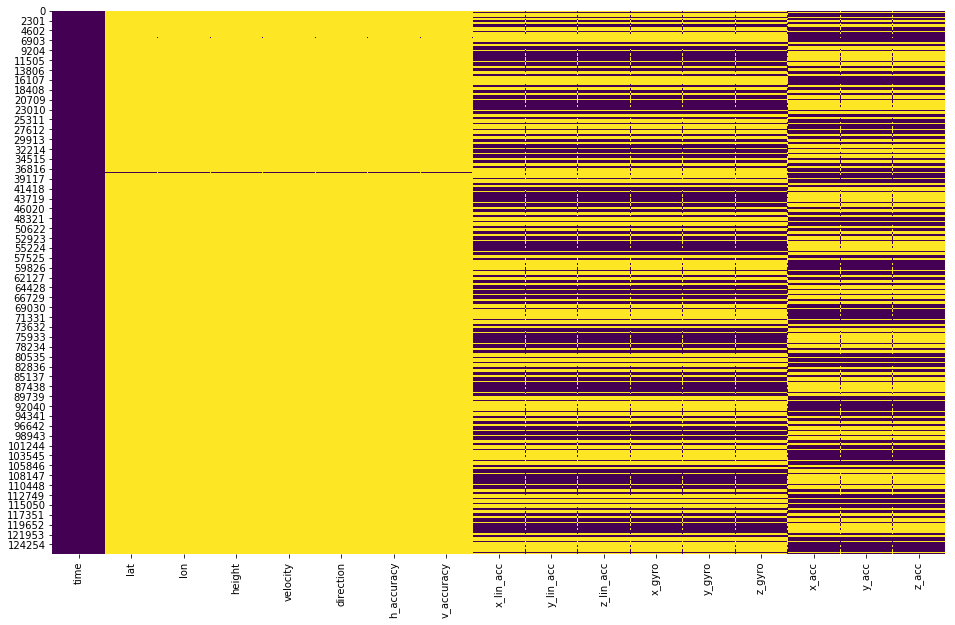

In [14]:
sns.heatmap(df.isna(), cbar=False, cmap = "viridis")
plt.savefig("../reports/samplerate_cmap.png")

In [66]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 62966 entries, 0 to 62965
Data columns (total 17 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Latitude (°)             631 non-null    float64
 1   Longitude (°)            631 non-null    float64
 2   Height (m)               631 non-null    float64
 3   Velocity (m/s)           631 non-null    float64
 4   Direction (°)            631 non-null    float64
 5   Horizontal Accuracy (m)  631 non-null    float64
 6   Vertical Accuracy (°)    631 non-null    float64
 7   X (m/s^2)                62951 non-null  float64
 8   Y (m/s^2)                62951 non-null  float64
 9   Z (m/s^2)                62951 non-null  float64
 10  X (rad/s)                62951 non-null  float64
 11  Y (rad/s)                62951 non-null  float64
 12  Z (rad/s)                62951 non-null  float64
 13  Time (s)                 62966 non-null  float64
 14  X (m/s^2)             

In [67]:
df.describe()

,Latitude (°),Longitude (°),Height (m),Velocity (m/s),Direction (°),Horizontal Accuracy (m),Vertical Accuracy (°),X (m/s^2),Y (m/s^2),Z (m/s^2),X (rad/s),Y (rad/s),Z (rad/s),Time (s),X (m/s^2),Y (m/s^2),Z (m/s^2)
count,631.000000,631.000000,631.000000,631.000000,631.000000,631.000000,631.000000,62951.000000,62951.000000,62951.000000,62951.000000,62951.000000,62951.000000,62966.000000,62966.000000,62966.000000,62966.000000
mean,47.706067,17.706092,118.404886,15.918710,198.152300,10.036123,10.036123,-0.079382,-0.012316,-0.028826,-0.000644,-0.001393,-0.007485,316.118133,0.093499,-0.264361,9.739353
std,0.005536,0.011677,2.906662,6.182333,111.210016,16.603497,16.603497,1.354332,0.552350,0.310726,0.022619,0.020079,0.147193,182.521461,1.595602,0.833039,0.308696
min,47.693402,17.687561,103.454252,-1.000000,-1.000000,4.000604,4.000604,-8.317548,-4.397162,-4.327921,-0.213253,-0.526529,-0.696578,0.000000,-8.780441,-6.176755,5.997877
25%,47.704902,17.693822,116.289695,11.551962,86.613785,8.001208,8.001208,-0.178717,-0.162184,-0.199854,-0.012490,-0.010707,-0.013388,158.051894,-0.215701,-0.508343,9.572743
50%,47.705995,17.710506,117.162605,18.448032,189.694571,8.001208,8.001208,-0.009901,-0.014963,-0.025149,-0.000026,-0.001488,0.000079,316.113910,0.094603,-0.253648,9.746083
75%,47.706672,17.716316,120.335795,20.381501,277.020279,12.001812,12.001812,0.168285,0.122561,0.145786,0.011656,0.007888,0.008677,474.181935,0.436792,0.012125,9.912799
max,47.717992,17.726061,127.877386,25.973469,358.060730,418.967358,418.967358,7.514613,3.738096,3.481913,0.201220,0.139472,0.759036,632.254525,7.336544,3.783233,13.257331


The signals from gps sensor seams to be very undersampled, and the signals from the gyroscape aren't really good. 
Some data exploration is needed to check weather the date useful

### Checking the signals from each signal

In [19]:
df.columns

Index(['time', 'lat', 'lon', 'height', 'velocity', 'direction', 'h_accuracy',
       'v_accuracy', 'x_lin_acc', 'y_lin_acc', 'z_lin_acc', 'x_gyro', 'y_gyro',
       'z_gyro', 'x_acc', 'y_acc', 'z_acc'],
      dtype='object')

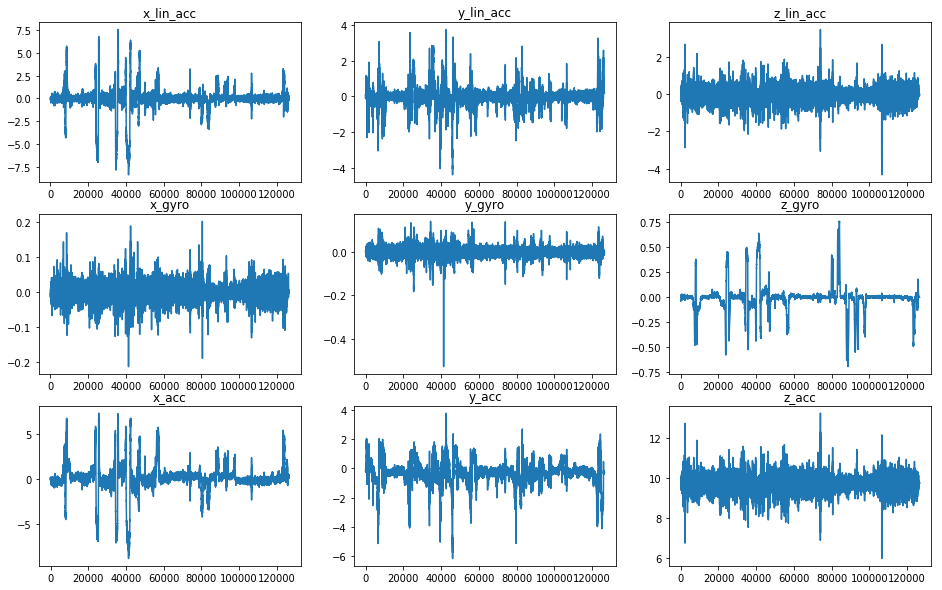

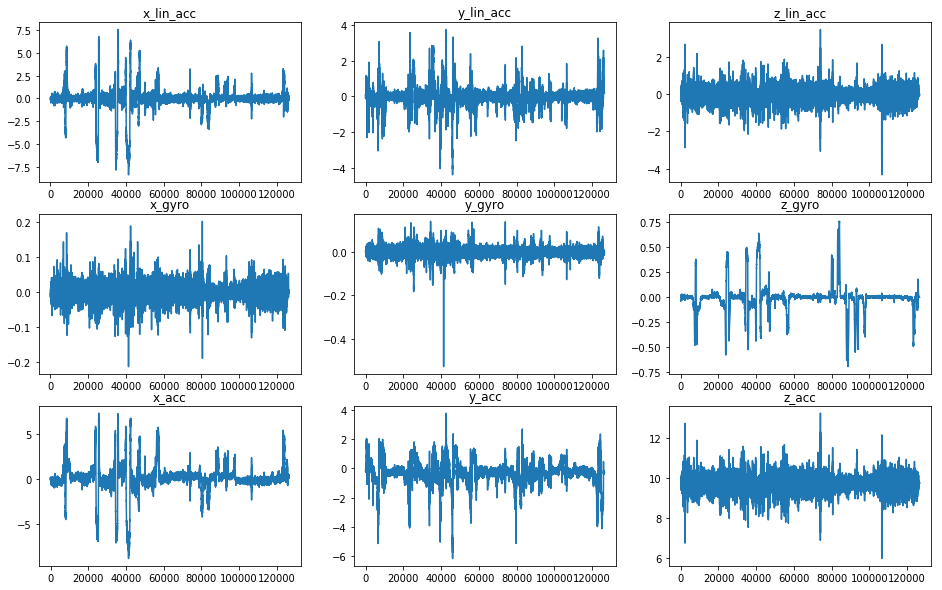

In [154]:
signals = ['x_lin_acc', 'y_lin_acc', 'z_lin_acc', 
                'x_gyro', 'y_gyro','z_gyro', 
                'x_acc', 'y_acc', 'z_acc']

def check_sensors(df, signals):
    
    
    fig,ax = plt.subplots(3,3)

    plot_id = []

    for i in range(0,3):
        for j in range(0,3):
            plot_id.append([i,j])


    for  p_id,sig in zip(plot_id,signals):

        ax[p_id[0],p_id[1]].plot(df[sig].dropna())
        ax[p_id[0],p_id[1]].set_title(sig)
        
    return fig

check_sensors(df, signals)

# plt.savefig("../reports/check_sensors.png")

In [17]:

fig = go.Figure()

trace = go.Scatter(
x = df["time"],
y = df["x_gyro"],
mode =  "lines",
connectgaps = True)

fig.add_trace(trace)

In [71]:
df.columns

Index(['Latitude (°)', 'Longitude (°)', 'Height (m)', 'Velocity (m/s)',
       'Direction (°)', 'Horizontal Accuracy (m)', 'Vertical Accuracy (°)',
       'X (m/s^2)', 'Y (m/s^2)', 'Z (m/s^2)', 'X (rad/s)', 'Y (rad/s)',
       'Z (rad/s)', 'Time (s)', 'X (m/s^2)', 'Y (m/s^2)', 'Z (m/s^2)'],
      dtype='object')

### Checking the gps signal 

In [72]:
fig = px.scatter_mapbox(df, lat="Latitude (°)", lon="Longitude (°)",zoom = 12, height=300)
fig.update_layout(mapbox_style="carto-positron")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

### Preposcesssing data

In [117]:
df = read_measurement("../data/raw_data_train/rsq_q1/*")

df["time_groups"] = (df["time"] / 0.01).apply(lambda x: int(x))

df = df.groupby("time_groups").mean()
df["time"] = df.index/(1/0.01)

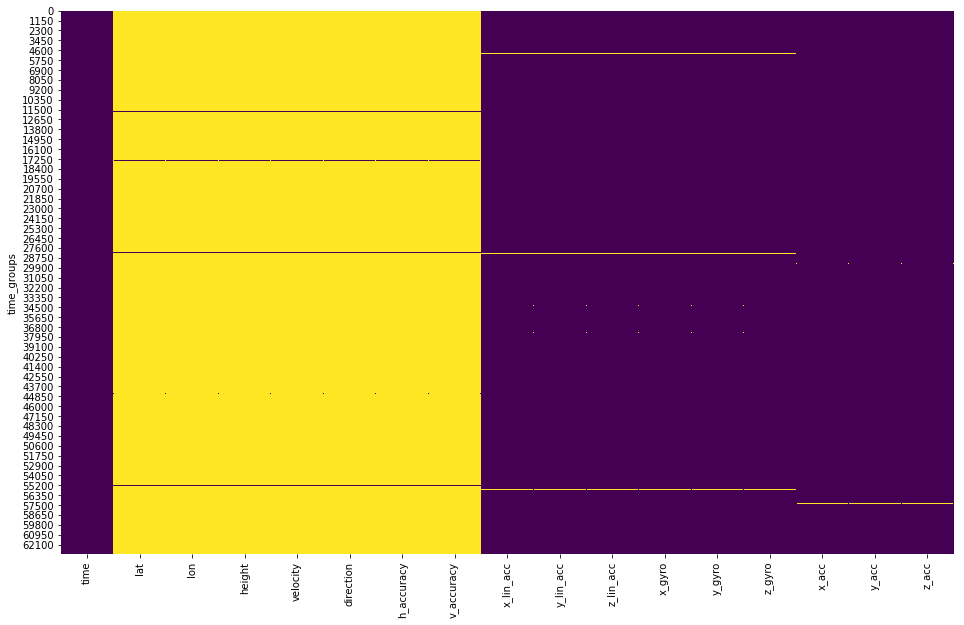

In [103]:
sns.heatmap(df.isna(), cbar=False, cmap = "viridis")
plt.savefig("../reports/samplerate_cmap_after_processing.png")

#### Filling the na values

For the gps values the filling prcess is straight forward, I use here ffill, so I can use the gps signal as the groupping parameter for the other signals. This means I will create the feature for the machine learning model with the help of the gps data points. I can class the road surface for each gps data point.

For the sensoor data the forward fill method is not appropriate, because the datapoints will be repeted , and the sensor data is continous, this means an interpolations method can be better.

It could be that the exact same gps coordinate exist not only one time. So we need to indentify each gps data points, to avoid the faulty data aggregation

In [12]:
gps_data =  df[['lat', 'lon', 'height', 'velocity', 'direction', 'h_accuracy',
               'v_accuracy']]

In [30]:
gps_data["helper_1"] = np.where(gps_data["lat"].notna(),1,0)
gps_data["id_gps"] = gps_data["helper_1"].cumsum()
gps_data.head()

c:\users\mesza\.virtualenvs\road-surface-quality-7nv9hwjf\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

c:\users\mesza\.virtualenvs\road-surface-quality-7nv9hwjf\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,lat,lon,height,velocity,direction,h_accuracy,v_accuracy,helper_1,id_gps
0,47.696266,17.726061,118.34948,-1.0,-1.0,418.967358,418.967358,1,1
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,1
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,1
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,1
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,1


If the theory correct, than the number of gps data points should be equal to the las value of the id_gps column

,helper_1
0,1
1,0
2,0
3,0
4,0
...,...
126542,0
126543,0
126544,0
126545,0


In [89]:

gps_data = pd.concat([gps_data,pd.DataFrame(columns=["helper_1"], data = np.where(gps_data["lat"] >0,1,0))], axis=1)
gps_data["id_gps"] = gps_data["helper_1"].cumsum()

gps_data.head()

,lat,lon,height,velocity,direction,h_accuracy,v_accuracy,helper_1,id_gps,helper_1
0,47.696266,17.726061,118.34948,-1.0,-1.0,418.967358,418.967358,1,1,1
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,1,0
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,1,0
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,1,0
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,1,0


In [118]:

time = df["time"]



gps_data = df[['lat', 'lon', 'height', 'velocity', 'direction', 'h_accuracy',
               'v_accuracy']].fillna(method="ffill")


sensor_data = df[['x_lin_acc', 'y_lin_acc', 'z_lin_acc', 
                 'x_gyro', 'y_gyro','z_gyro', 
                 'x_acc', 'y_acc', 'z_acc']].interpolate(method='polynomial', order=2)

#the first values are empty -> fill it up with nulls
print("Number of NaN-s: ", pd.concat([time,gps_data,sensor_data], axis=1).isna().sum())





Number of NaN-s:  time           0
lat            0
lon            0
height         0
velocity       0
direction      0
h_accuracy     0
v_accuracy     0
x_lin_acc     14
y_lin_acc     14
z_lin_acc     14
x_gyro        14
y_gyro        14
z_gyro        14
x_acc          0
y_acc          0
z_acc          0
dtype: int64


In [119]:
df = pd.concat([time,gps_data,sensor_data], axis=1).dropna()

In [122]:
df.isna().sum()

time          0
lat           0
lon           0
height        0
velocity      0
direction     0
h_accuracy    0
v_accuracy    0
x_lin_acc     0
y_lin_acc     0
z_lin_acc     0
x_gyro        0
y_gyro        0
z_gyro        0
x_acc         0
y_acc         0
z_acc         0
dtype: int64

In [120]:
df.head()

,time,lat,lon,height,velocity,direction,h_accuracy,v_accuracy,x_lin_acc,y_lin_acc,z_lin_acc,x_gyro,y_gyro,z_gyro,x_acc,y_acc,z_acc
time_groups,,,,,,,,,,,,,,,,,
14,0.14,47.696266,17.726061,118.34948,-1.0,-1.0,418.967358,418.967358,-0.068991,0.116175,-0.231500,-0.010804,0.001345,-0.033967,0.010029,-0.066162,9.487570
15,0.15,47.696266,17.726061,118.34948,-1.0,-1.0,418.967358,418.967358,0.119553,0.105636,-0.053966,0.001346,0.008800,-0.035701,-0.054936,-0.025597,9.624087
16,0.16,47.696266,17.726061,118.34948,-1.0,-1.0,418.967358,418.967358,0.013766,-0.061842,-0.085847,-0.007075,0.005302,-0.027966,0.181722,-0.081730,9.736653
17,0.17,47.696266,17.726061,118.34948,-1.0,-1.0,418.967358,418.967358,0.063374,0.128633,-0.271607,-0.007945,0.006663,-0.028829,0.057930,-0.128134,9.693692
18,0.18,47.696266,17.726061,118.34948,-1.0,-1.0,418.967358,418.967358,0.089934,0.096254,-0.355428,-0.004748,-0.002140,-0.035702,0.103884,-0.026944,9.488020


Checking the time biggest time jump in the signal

In [124]:
df["time_shift"] = df["time"].shift()

In [131]:
print("The biggest time jump in the signal is: {:.3f}".format((df["time"] - df["time_shift"]).max()))

The biggest time jump in the signal is: 0.010


In this case the interpolation is not neccessery, but in the future it might be a measurement will be corrupted, and the time stamp correction will be neccessary. In order to avoid from this problem I will build in a if-else statement, if the time jump bigger than the sample rate.

In [90]:
def data_processing(df, sample_rate):
    
    #creating time groups in order to evenly sample the time points
    df["time_groups"] = (df["time"] / sample_rate).apply(lambda x: int(x))
    
    #dividing the time groups by 1/sample rate --> correct time stamps
    df = df.groupby("time_groups").mean()
    df["time"] = df.index/(1/sample_rate)
    
    
    time = df["time"]
    
    gps_data = df[['lat', 'lon', 'height', 'velocity', 'direction', 'h_accuracy',
                   'v_accuracy']]
    gps_data = pd.concat([gps_data,
                          pd.DataFrame(columns=["helper_1"], 
                                       data = np.where(gps_data["lat"] >0,1,0))],
                         axis=1)
    gps_data["id_gps"] = gps_data["helper_1"].cumsum()

    gps_data.fillna(method="ffill", inplace = True)
    gps_data.drop("helper_1", axis = 1, inplace = True)
    
    
    sensor_data = df[['x_lin_acc', 'y_lin_acc', 'z_lin_acc', 
                     'x_gyro', 'y_gyro','z_gyro', 
                     'x_acc', 'y_acc', 'z_acc']].interpolate(method='polynomial', order=2)
    
    df = pd.concat([time,gps_data,sensor_data], axis=1).dropna()
    
    df["time_shift"] = df["time"].shift()
    
    if round((df["time"] - df["time_shift"]).max(), 2) > sample_rate:
        pass
    
    df.drop("time_shift", axis = 1, inplace = True)
    
    return df
    
    

In [91]:
path = glob.glob("../data/raw_data_train/rsq_q1/*")
path[0].split('\\')[0]

'../data/raw_data_train/rsq_q1'

In [92]:
def read_measurement(path, sample_rate):
    
    df = pd.DataFrame()
    
    c = 0
    
    for path in glob.glob(path):
        
        new_df = pd.read_csv(path)
        new_df["sensor"] = path.split('.csv')[0].split("\\")[1]
        df = pd.concat([new_df,df], axis=0)    
        c+=1
        
    df = df.pivot_table(index="Time (s)", columns="sensor")

    df = df.reset_index().sort_values("Time (s)")

    new_columns = [
                    "time", "direction", "height", "h_accuracy", "lat", "lon", "velocity", "v_accuracy",
                    "x_acc", "x_lin_acc", "x_gyro",
                    "y_acc", "y_lin_acc", "y_gyro",
                    "z_acc", "z_lin_acc", "z_gyro"
                ]
    df.columns = [i for i in new_columns]

    df =df[["time","lat", "lon", "height", 
            "velocity", "direction",
            "h_accuracy", "v_accuracy", 
            "x_lin_acc", "y_lin_acc", "z_lin_acc", 
            "x_gyro", "y_gyro", "z_gyro",
            "x_acc","y_acc","z_acc", ]]


    df = data_processing(df,sample_rate)
    
    return df
        

In [93]:
read_measurement("../data/raw_data_train/rsq_q1/*",0.01)

,time,lat,lon,height,velocity,direction,h_accuracy,v_accuracy,id_gps,x_lin_acc,y_lin_acc,z_lin_acc,x_gyro,y_gyro,z_gyro,x_acc,y_acc,z_acc
14,0.14,47.696266,17.726061,118.349480,-1.000000,-1.00000,418.967358,418.967358,1,-0.068991,0.116175,-0.231500,-0.010804,0.001345,-0.033967,0.010029,-0.066162,9.487570
15,0.15,47.696266,17.726061,118.349480,-1.000000,-1.00000,418.967358,418.967358,1,0.119553,0.105636,-0.053966,0.001346,0.008800,-0.035701,-0.054936,-0.025597,9.624087
16,0.16,47.696266,17.726061,118.349480,-1.000000,-1.00000,418.967358,418.967358,1,0.013766,-0.061842,-0.085847,-0.007075,0.005302,-0.027966,0.181722,-0.081730,9.736653
17,0.17,47.696266,17.726061,118.349480,-1.000000,-1.00000,418.967358,418.967358,1,0.063374,0.128633,-0.271607,-0.007945,0.006663,-0.028829,0.057930,-0.128134,9.693692
18,0.18,47.696266,17.726061,118.349480,-1.000000,-1.00000,418.967358,418.967358,1,0.089934,0.096254,-0.355428,-0.004748,-0.002140,-0.035702,0.103884,-0.026944,9.488020
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
63221,632.21,47.705009,17.716236,118.863225,0.121996,182.29248,8.001208,8.001208,631,0.066170,0.229759,-0.042592,0.001690,-0.000458,0.001453,0.424817,-0.269290,9.759106
63222,632.22,47.705009,17.716236,118.863225,0.121996,182.29248,8.001208,8.001208,631,0.115775,0.162368,-0.001455,0.003026,0.003908,0.000451,0.422422,-0.327369,9.798923
63223,632.23,47.705009,17.716236,118.863225,0.121996,182.29248,8.001208,8.001208,631,-0.089811,0.176668,-0.001088,-0.001056,-0.001030,-0.000730,0.202978,-0.290546,9.785601
63224,632.24,47.705009,17.716236,118.863225,0.121996,182.29248,8.001208,8.001208,631,-0.091544,0.223200,-0.026698,0.002019,0.003375,-0.000645,0.279319,-0.257315,9.762100


#### Checking the sensor signals after preprocessing

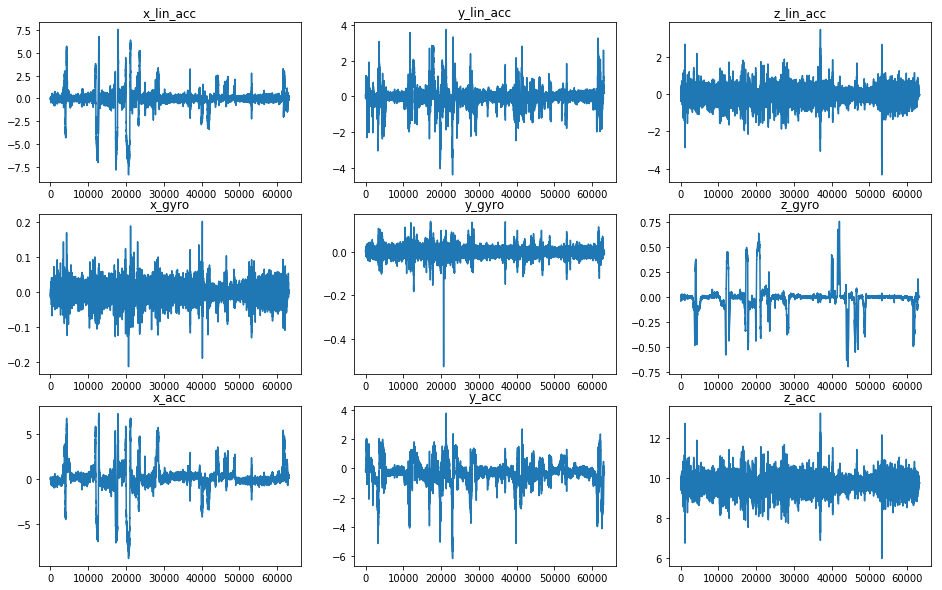

In [72]:
signals = ['x_lin_acc', 'y_lin_acc', 'z_lin_acc', 
                'x_gyro', 'y_gyro','z_gyro', 
                'x_acc', 'y_acc', 'z_acc']

def check_sensors(df, signals):
    
    
    fig,ax = plt.subplots(3,3)

    plot_id = []

    for i in range(0,3):
        for j in range(0,3):
            plot_id.append([i,j])


    for  p_id,sig in zip(plot_id,signals):

        ax[p_id[0],p_id[1]].plot(df[sig].dropna())
        ax[p_id[0],p_id[1]].set_title(sig)


check_sensors(test, signals)

##  Read all  reference measuremetns

In [40]:
df.columns

Index(['time', 'lat', 'lon', 'height', 'velocity', 'direction', 'h_accuracy',
       'v_accuracy', 'x_lin_acc', 'y_lin_acc', 'z_lin_acc', 'x_gyro', 'y_gyro',
       'z_gyro', 'x_acc', 'y_acc', 'z_acc'],
      dtype='object')

In [73]:
def read_all(sample_rate = 0.01):
    
    q1 = read_measurement("../data/raw_data_train/rsq_q1/*",sample_rate=sample_rate)
    q1["label"] = 0
    q2 = read_measurement("../data/raw_data_train/rsq_q2/*", sample_rate=sample_rate)
    q2["label"] = 1
    q3 = read_measurement("../data/raw_data_train/rsq_q3/*", sample_rate=sample_rate)
    q3["label"] = 2
    
    
    df = pd.concat([q1,q2,q3],axis=0)

    cols = list(df.columns)
    cols.remove("time")
    return df[["time"] + cols]

In [74]:
df_all = read_all()

c:\users\mesza\.virtualenvs\road-surface-quality-7nv9hwjf\lib\site-packages\ipykernel_launcher.py:15: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

c:\users\mesza\.virtualenvs\road-surface-quality-7nv9hwjf\lib\site-packages\ipykernel_launcher.py:16: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

c:\users\mesza\.virtualenvs\road-surface-quality-7nv9hwjf\lib\site-packages\pandas\core\frame.py:4317: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in t

In [76]:
df_all.sort_values(["label","time"], inplace=True)
df_all.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 94893 entries, 14 to 12879
Data columns (total 19 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   time        94893 non-null  float64
 1   lat         94893 non-null  float64
 2   lon         94893 non-null  float64
 3   height      94893 non-null  float64
 4   velocity    94893 non-null  float64
 5   direction   94893 non-null  float64
 6   h_accuracy  94893 non-null  float64
 7   v_accuracy  94893 non-null  float64
 8   id_gps      94893 non-null  int32  
 9   x_lin_acc   94893 non-null  float64
 10  y_lin_acc   94893 non-null  float64
 11  z_lin_acc   94893 non-null  float64
 12  x_gyro      94893 non-null  float64
 13  y_gyro      94893 non-null  float64
 14  z_gyro      94893 non-null  float64
 15  x_acc       94893 non-null  float64
 16  y_acc       94893 non-null  float64
 17  z_acc       94893 non-null  float64
 18  label       94893 non-null  int64  
dtypes: float64(17), int32(1)

In [ ]:
fig = px.scatter_mapbox(df_all, 
                        lat="lat", 
                        lon="lon",
                        zoom = 12, 
                        height=500, 
                        color = "label", 
                        color_continuous_scale=["green","blue","red"])
fig.update_layout(mapbox_style="carto-positron")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.layout.coloraxis.showscale = False
fig
# fig.write_image("../reports/map_reference.png")